<a href="https://colab.research.google.com/github/ritwiks9635/Segmentation-Model/blob/main/Image_Segmentation_using_KerasCV_and_HF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**HuggingFace And KerasCV API for Image Segmentation**

[BDD100K](https://www.kaggle.com/datasets/solesensei/solesensei_bdd100k)

In [ ]:
!unzip /content/https:/www.kaggle.com/datasets/solesensei/solesensei_bdd100k/solesensei_bdd100k.zip

In [ ]:
# Download KerasCV model
!pip install -q git+https://github.com/keras-team/keras-cv@v0.6.4

# Download Transformer library for huggingface
!pip install -q git+https://github.com/huggingface/transformers.git

In [5]:
import numpy as np
import pandas as pd

import logging
from IPython.display import clear_output

import warnings
warnings.filterwarnings('ignore')

import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
logging.disable(logging.WARNING)

from PIL import Image
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split

In [6]:
import keras_cv
import tensorflow as tf
from tensorflow import keras

Using TensorFlow backend


In [7]:
try:
    physical_devices = tf.config.list_physical_devices('GPU')
    tf.config.optimizer.set_jit(True)
    keras.mixed_precision.set_global_policy("mixed_float16")
    [tf.config.experimental.set_memory_growth(pd, True) for pd in physical_devices]
    strategy = tf.distribute.MirroredStrategy()
except:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver.connect(tpu="local")
    strategy = tf.distribute.TPUStrategy(tpu)
    keras.mixed_precision.set_global_policy("mixed_bfloat16")

In [8]:
data_dir = "/content/bdd100k_seg/bdd100k/seg/"

exts = ("jpg", "JPG", "PNG", "png")

image_dir = os.path.join(data_dir, "images", "train")
label_dir = os.path.join(data_dir, "labels", "train")

In [9]:
print("Total length of images :: ", len(os.listdir(image_dir)))
print("Total length of Mask :: ", len(os.listdir(label_dir)))

Total length of images ::  7000
Total length of Mask ::  7000


In [10]:
images = sorted(
    [
        os.path.join(image_dir, fname)
        for fname in os.listdir(image_dir)
        if fname.endswith(exts) and not fname.startswith(".")
    ])

masks = sorted(
    [
        os.path.join(label_dir, fname)
        for fname in os.listdir(label_dir)
        if fname.endswith(exts) and not fname.startswith(".")
    ])

In [11]:
images[0], masks[0]

('/content/bdd100k_seg/bdd100k/seg/images/train/0004a4c0-d4dff0ad.jpg',
 '/content/bdd100k_seg/bdd100k/seg/labels/train/0004a4c0-d4dff0ad_train_id.png')

In [62]:
def display(display_list, extra_title=''):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask']

    if len(display_list) > len(title):
        title.append(extra_title)

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy().astype(np.uint8), cmap='viridis')
        plt.axis('off')
    plt.show()

In [13]:
id2label = {
    0:  'road',
    1:  'sidewalk',
    2:  'building',
    3:  'wall',
    4:  'fence',
    5:  'pole',
    6:  'traffic light',
    7:  'traffic sign',
    8:  'vegetation',
    9:  'terrain',
    10: 'sky',
    11: 'person',
    12: 'rider',
    13: 'car',
    14: 'truck',
    15: 'bus',
    16: 'train',
    17: 'motorcycle',
    18: 'bicycle',
}

label2id = {label : id for id, label in id2label.items()}
n_classes = len(label2id)
n_classes

19

In [14]:
train_img, test_img, train_mask, test_mask = train_test_split(images, masks, test_size = 0.2, random_state = 42)

print(len(train_img), len(test_img))
print(len(train_mask), len(test_mask))

5600 1400
5600 1400


In [15]:
img_size = 224
batch_size = 16 * strategy.num_replicas_in_sync

def read_file(data_path, mask = False):
    image = tf.io.read_file(data_path)
    if mask:
        image = tf.io.decode_png(image, channels = 1)
        image = tf.image.resize(image, [img_size, img_size], method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
        image = tf.where(image == 255, np.dtype('uint8').type(0), image)
        image = tf.cast(image, tf.float32)

    else:
        image = tf.io.decode_png(image, channels = 3)
        image = tf.image.resize(image, [img_size, img_size])
        image = tf.cast(image, tf.float32)
    return image

##**KerasCV Model**

In [16]:
def load_data(image_path, mask_path):
    image = read_file(image_path)
    mask = read_file(mask_path, mask = True)
    return image, mask



def data_generator(image_list, mask_list, split = "train"):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.shuffle(10 * batch_size) if split == "train" else dataset
    dataset = dataset.map(load_data, num_parallel_calls = tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size, drop_remainder=True)
    dataset = dataset.prefetch(buffer_size = tf.data.AUTOTUNE)
    return dataset

In [17]:
train_dataset = data_generator(train_img, train_mask)
valid_dataset = data_generator(test_img, test_mask, split = "validation")

Image shape is ::  (16, 224, 224, 3)
Mask shaps is ::  (16, 224, 224, 1)


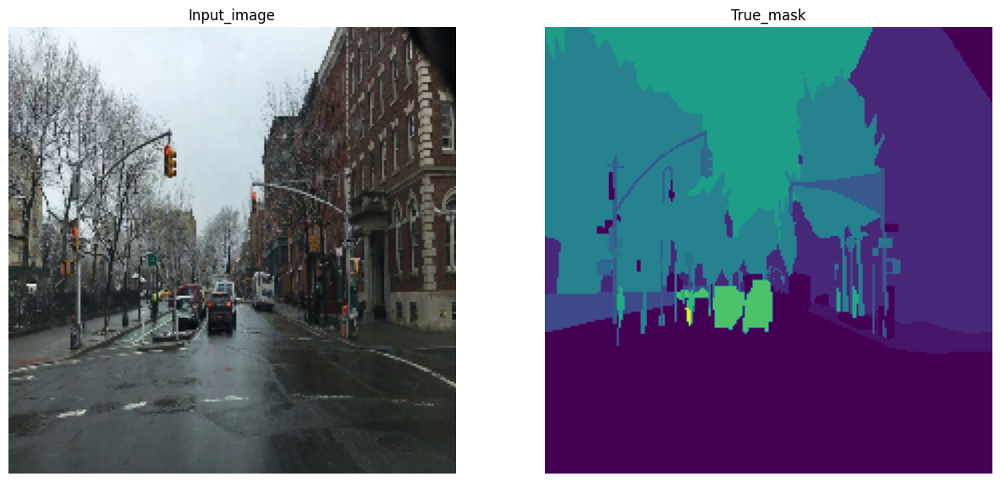

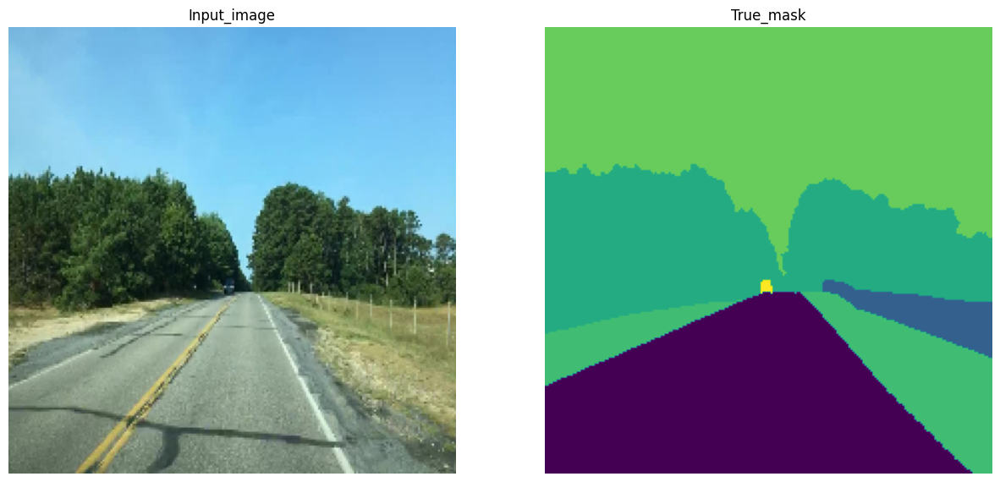

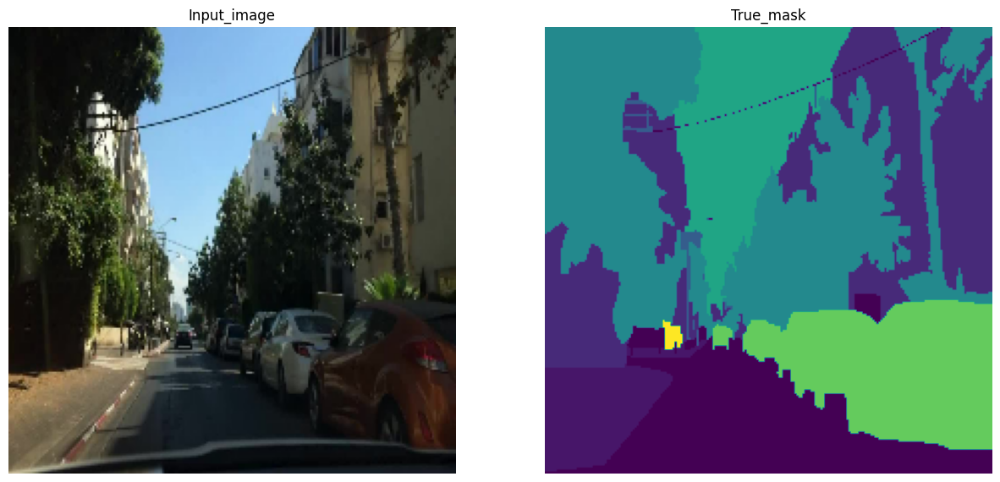

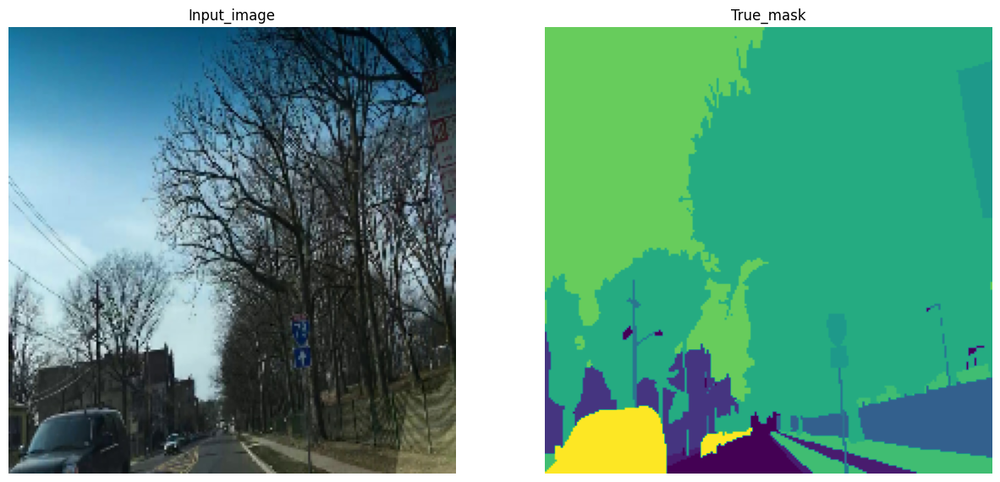

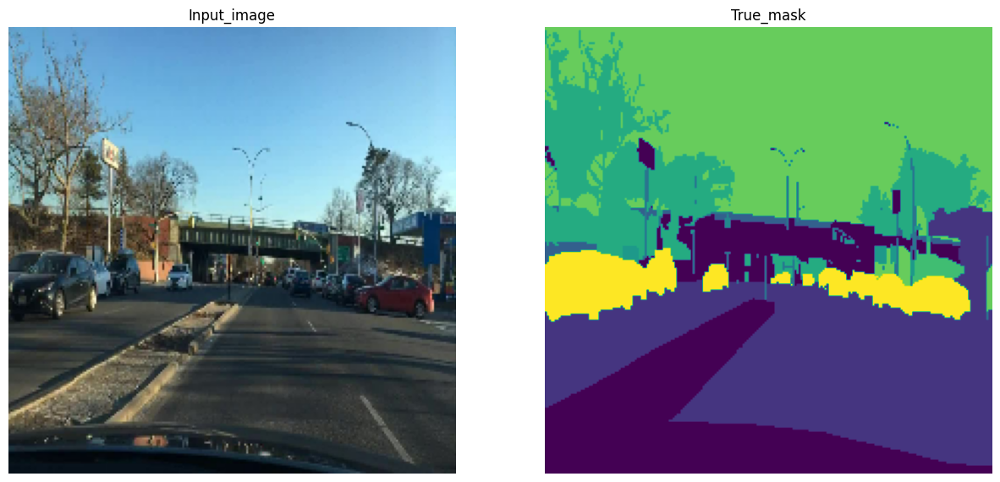

...

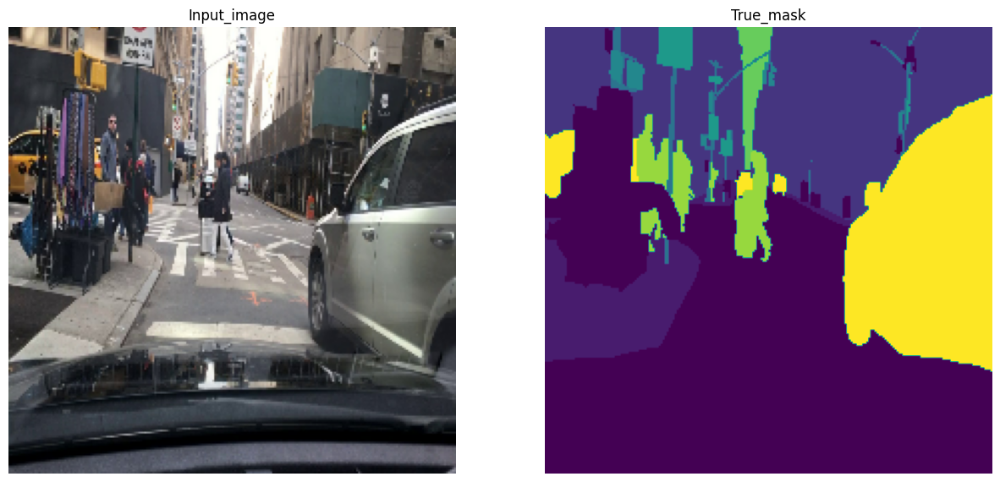

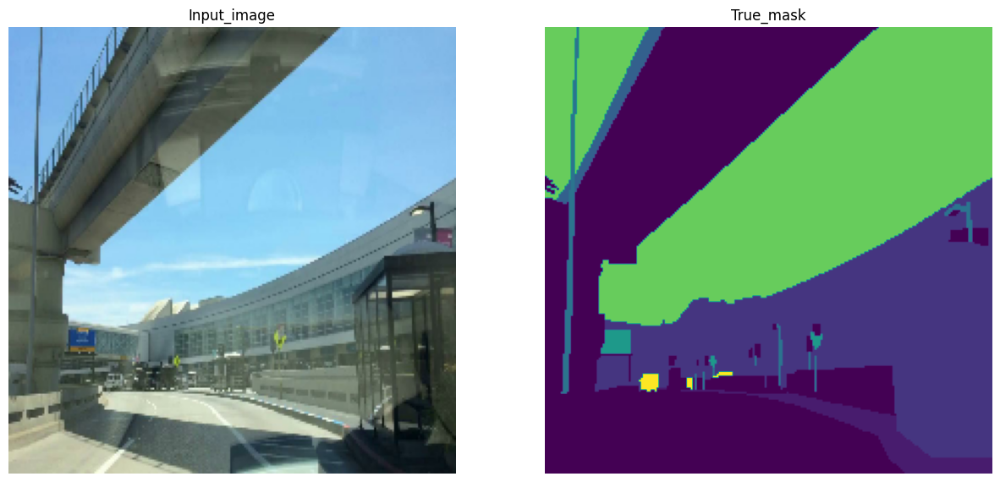

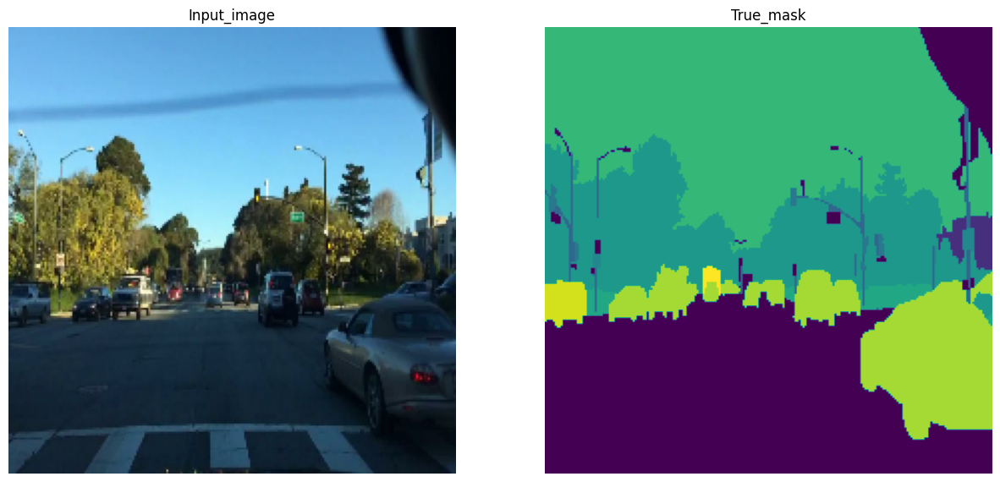

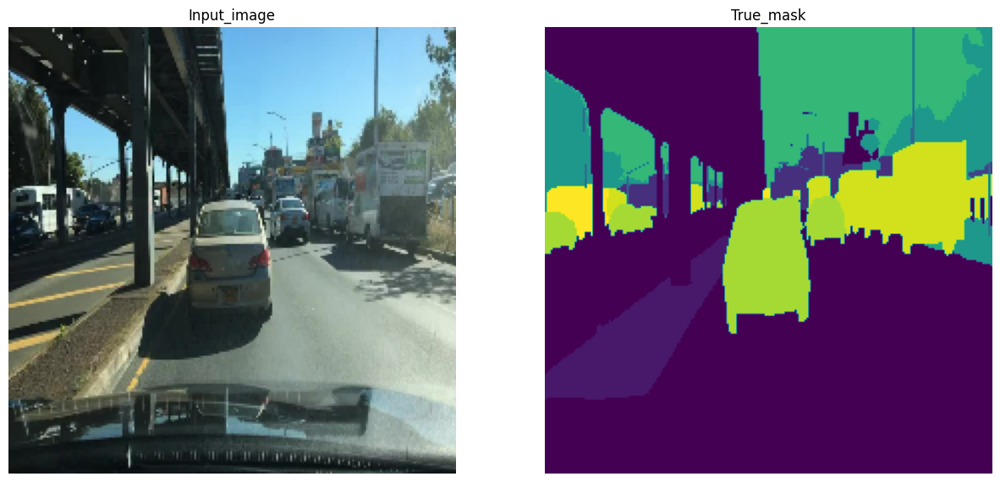

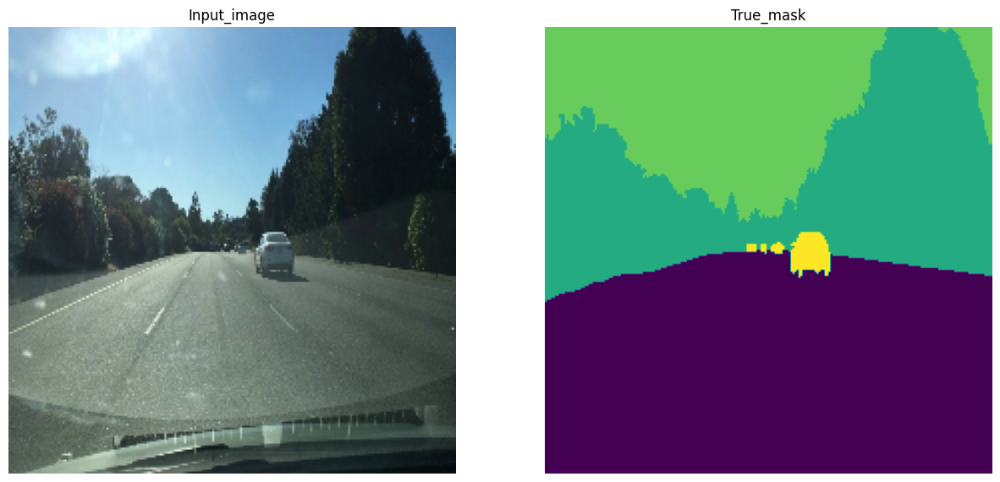

In [18]:
x, y = next(iter(train_dataset))
print("Image shape is :: ", x.shape)
print("Mask shaps is :: ", y.shape)

for x, y in zip(x, y):
    display_data([x, y])

In [19]:
from keras_cv.models import ResNet50Backbone as backbone
from keras_cv.models.segmentation import DeepLabV3Plus

In [35]:
keras.backend.clear_session()

with strategy.scope():
    seg_backbone = backbone.from_preset(preset = "resnet50_imagenet", input_shape = (img_size, img_size, 3))
    model = DeepLabV3Plus(
        num_classes = n_classes,
        backbone = seg_backbone,
       )


    model.compile(
        optimizer = keras.optimizers.Adam(learning_rate = 0.001),
        loss = keras.losses.SparseCategoricalCrossentropy(from_logits = False),
        metrics = ["accuracy"],
        jit_compile = True
    )

In [ ]:
model.fit(
    train_dataset,
    validation_data = valid_dataset,
    epochs = 10)

In [63]:
x, y = next(iter(train_dataset))
print(x.shape)

(16, 224, 224, 3)


1/1 [==============================] - 0s 94ms/step
(16, 224, 224, 3) (16, 224, 224, 1) (16, 224, 224)


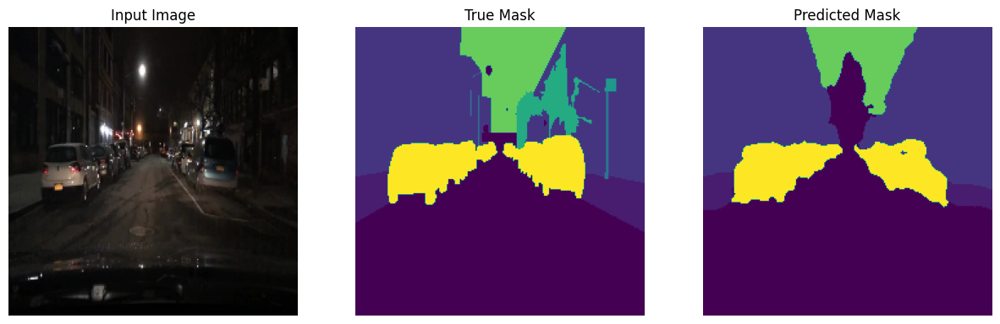

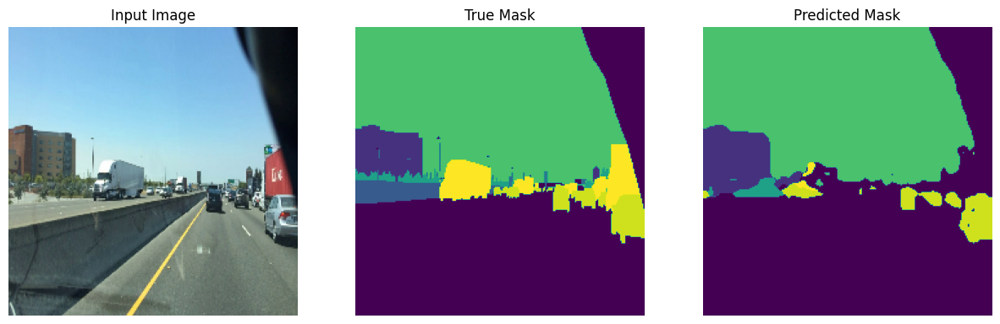

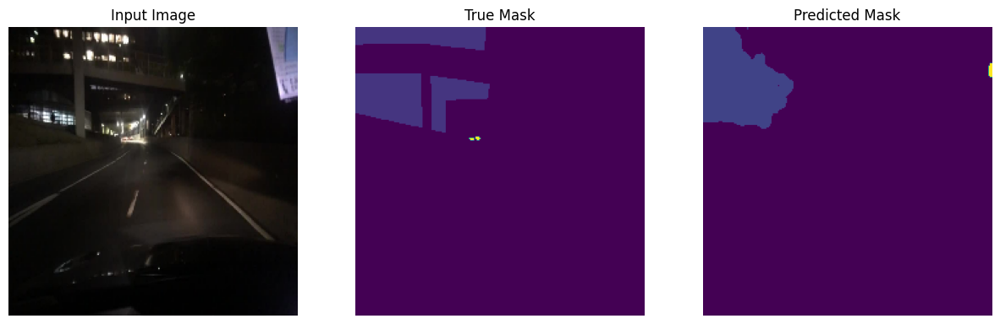

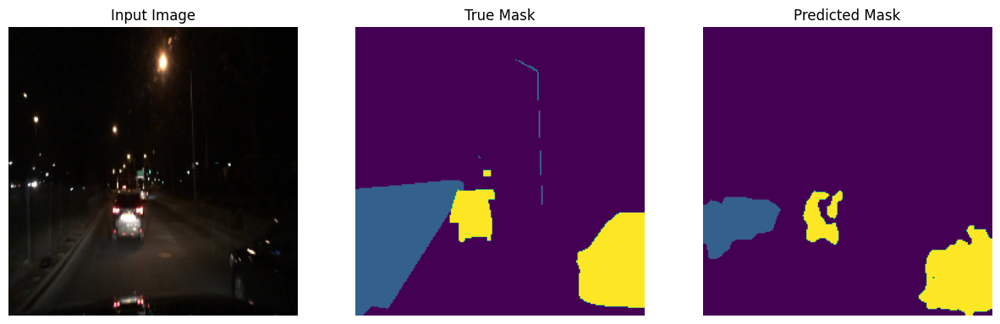

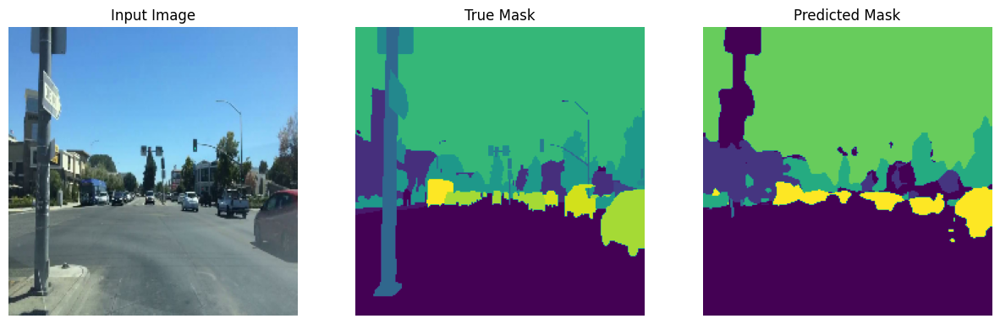

...

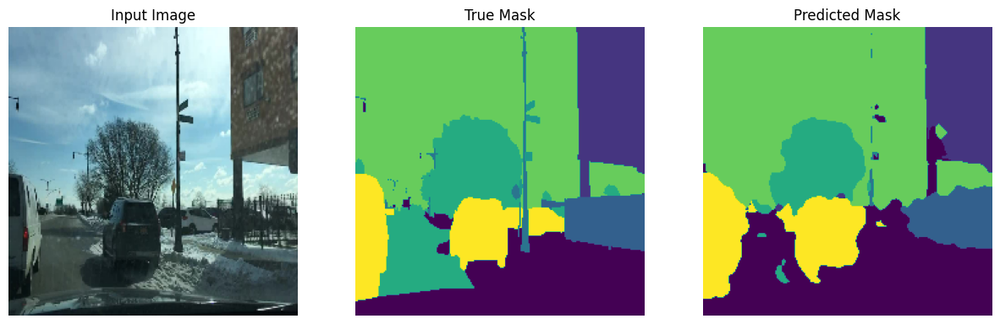

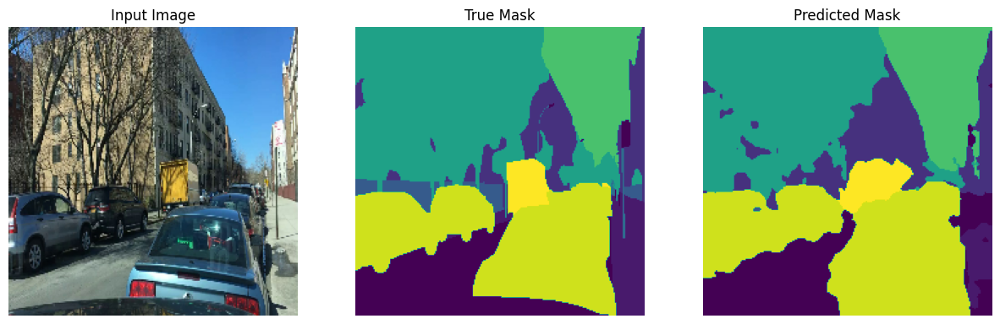

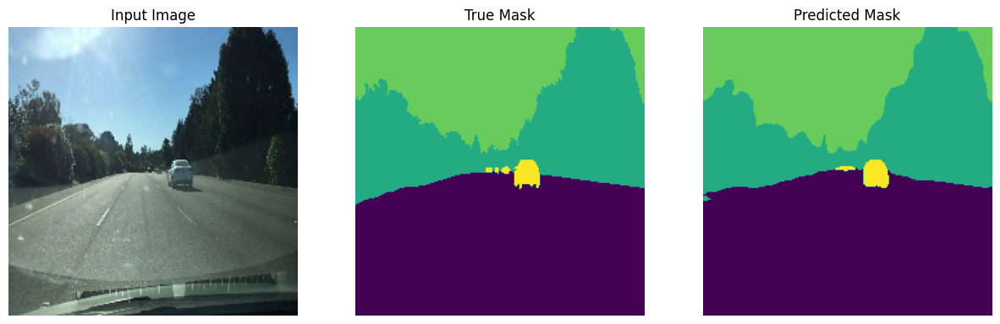

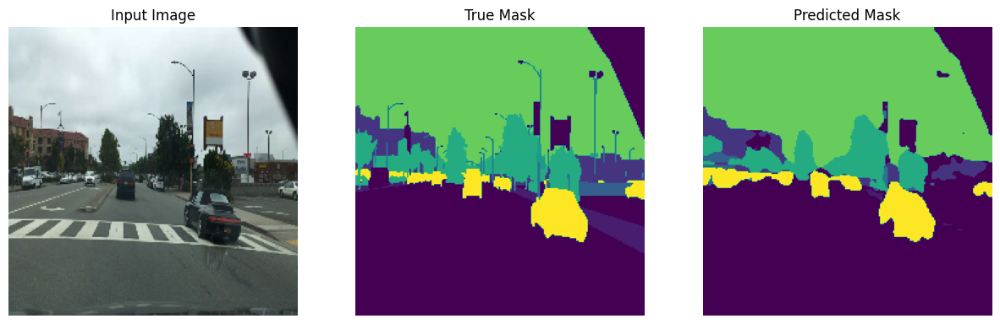

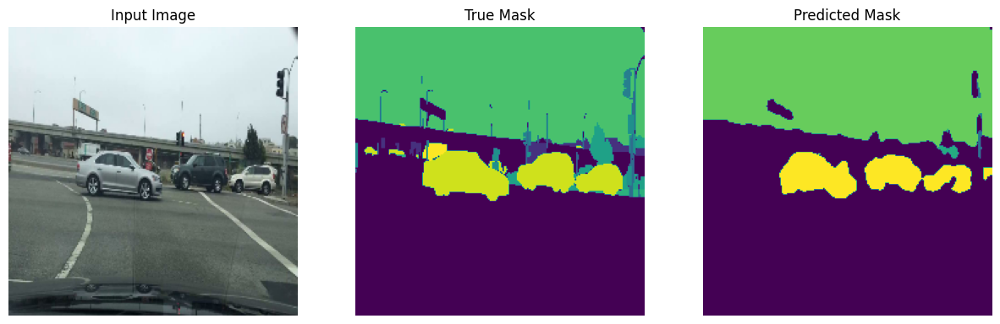

In [64]:
pred = model.predict(x)
pred = tf.math.argmax(pred, axis=-1)
print(x.shape, y.shape, pred.shape)

for x, y, y_pred in zip(x, y, pred):
    display([x, y, y_pred], extra_title = "Predicted Mask")

##**Huggingface Model**

In [66]:
def load_data_hf(image_list, mask_list):
    image = read_file(image_list)
    mask = read_file(mask_list, mask = True)
    image = tf.transpose(image, (2, 0, 1))
    mask = tf.squeeze(mask)

    return {
    "pixel_values" : image,
    "labels" : mask
    }


def data_generator_hf(image_list, mask_list, split = "train"):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.shuffle(10 * batch_size) if split == "train" else dataset
    dataset = dataset.map(load_data_hf, num_parallel_calls = tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size, drop_remainder = True)
    dataset = dataset.prefetch(buffer_size = tf.data.AUTOTUNE)
    return dataset

In [67]:
train_ds_hf = data_generator_hf(train_img, train_mask)
valid_ds_hf = data_generator_hf(test_img, test_mask, split = "validation")

In [71]:
from transformers import TFSegformerForSemanticSegmentation

model_checkpoint = "nvidia/mit-b0"
keras.mixed_precision.set_global_policy("float32")

with strategy.scope():
    model_hf = TFSegformerForSemanticSegmentation.from_pretrained(
        model_checkpoint,
        num_labels = n_classes,
        id2label = id2label,
        label2id = label2id,
        ignore_mismatched_sizes = True,
    )

   # optimizer = keras.optimizers.Adam(learning_rate = 0.001)
    model_hf.compile(optimizer = "adam")

In [ ]:
model_hf.fit(
    train_ds_hf,
    validation_data = valid_ds_hf,
    epochs = 10)

In [101]:
val_batch = valid_ds_hf.take(1)
x = iter(val_batch).next()["pixel_values"]
y = iter(val_batch).next()["labels"]


pred = model_hf.predict(x)
pred = tf.transpose(pred.logits, [0, 2, 3, 1])
#outputs 16, 56, 56, 19
# In HF, logits are of shape (batch_size, num_labels, height/4, width/4)
pred = keras.layers.UpSampling2D(size = (4, 4))(pred)
#outputs TensorShape([16, 224, 224, 19])
pred = tf.math.argmax(pred, axis = -1)
#shape if x TensorShape([16, 3, 224, 224])
x = tf.transpose(x, [0, 2, 3, 1])
# to TensorShape([16, 224, 224, 3])
print(x.shape, y.shape, pred.shape)

1/1 [==============================] - 0s 102ms/step
(16, 224, 224, 3) (16, 224, 224) (16, 224, 224)


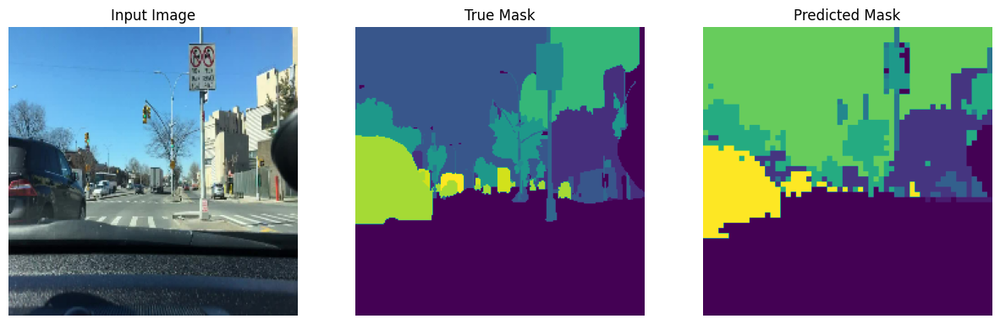

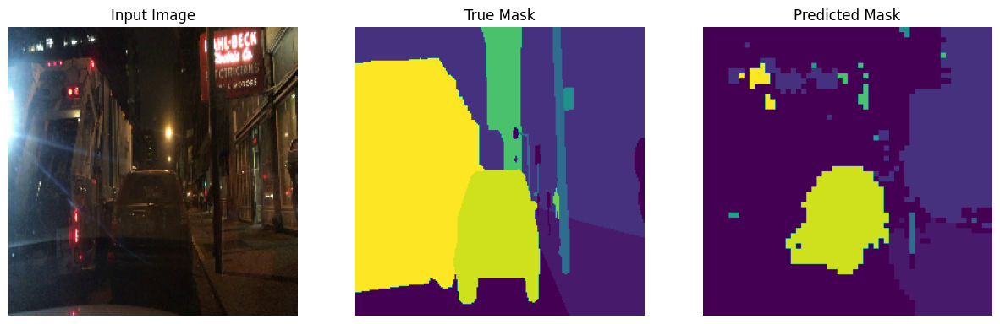

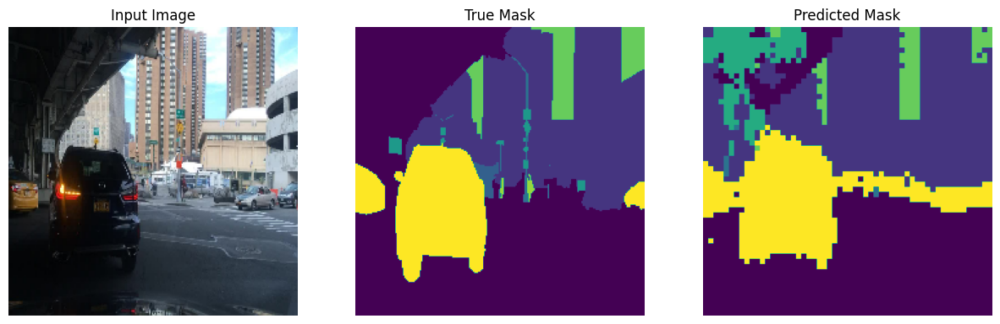

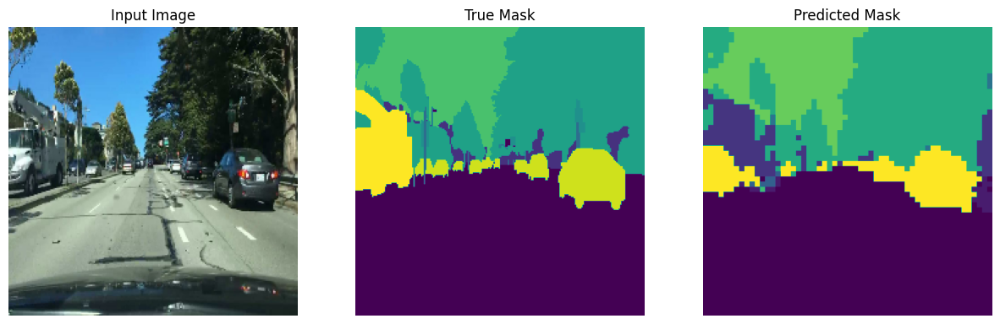

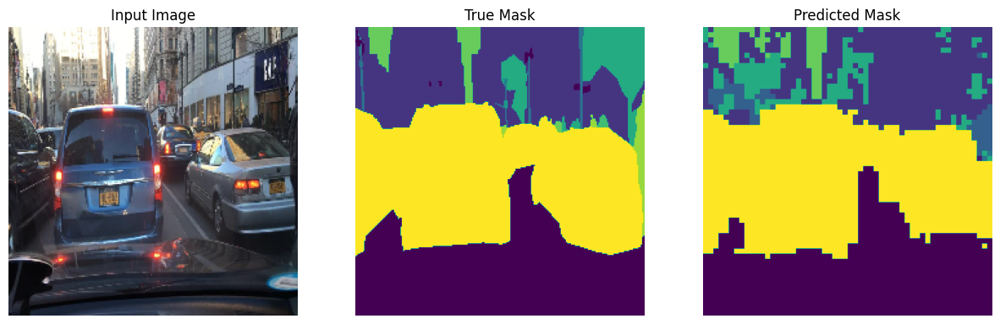

...

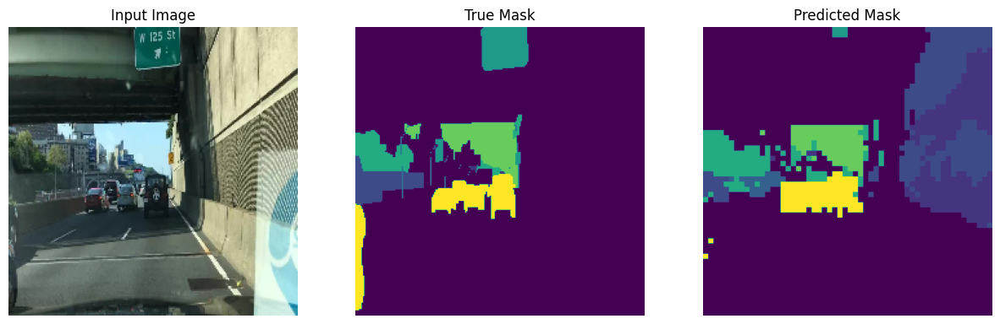

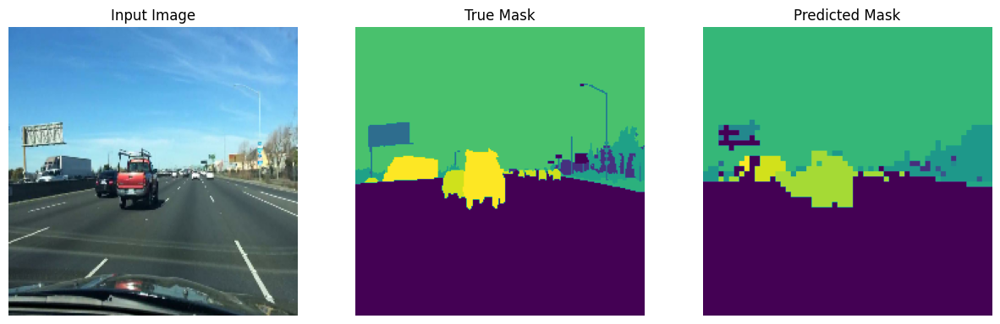

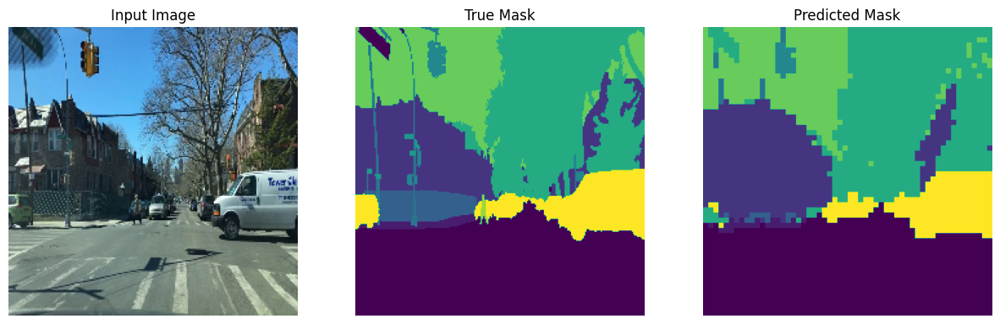

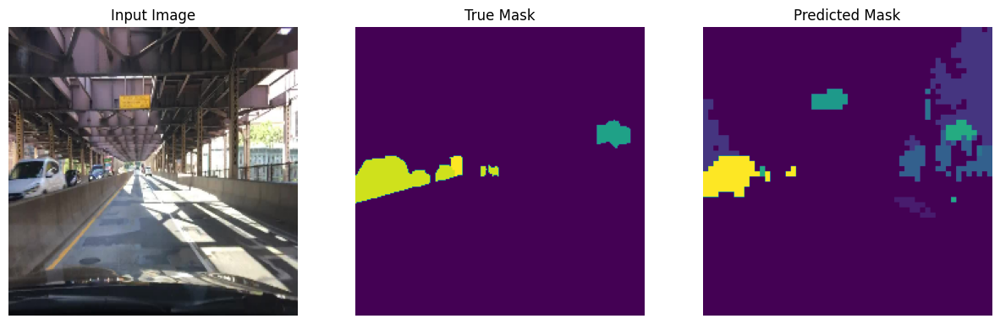

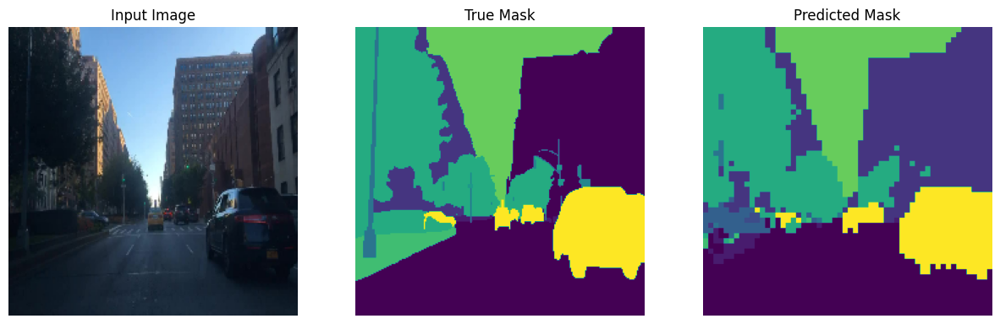

In [102]:
for x, y, y_pred in zip(x, y, pred):
    display([x, y, y_pred], extra_title='Predicted Mask')